In [1]:
import os
import re
import pickle
import matplotlib.pyplot as plt

In [2]:
all_files = os.listdir('results')

In [3]:
s1_experiments = list(filter(lambda x: 'Sentinel: 1' in x, all_files))
s2_experiments = list(filter(lambda x: 'Sentinel: 2' in x, all_files))

unique_setups_s1 = list(map(lambda x: ','.join(x.split(',')[:-2]), s1_experiments))

unique_setups_s2 = list(map(lambda x: ','.join(x.split(',')[:-2]), s2_experiments))


unique_setups_s1_with_results = {setup: [full_name_setup for full_name_setup in s1_experiments if full_name_setup[:len(setup + ', Sentinel: 1')] == setup + ', Sentinel: 1'] for setup in unique_setups_s1}
unique_setups_s2_with_results = {setup: [full_name_setup for full_name_setup in s2_experiments if full_name_setup[:len(setup + ', Sentinel: 2')] == setup + ', Sentinel: 2'] for setup in unique_setups_s2}

In [4]:
def get_results(path: str):
    
    with open(f"results/{path}", 'rb') as inf:
        result_dict = pickle.load(inf)

    return result_dict

In [5]:
ss = set()
for v in unique_setups_s1_with_results.values():
    ss.add(len(v))
ss

s = set()
for v in unique_setups_s2_with_results.values():
    s.add(len(v))

s == ss

True

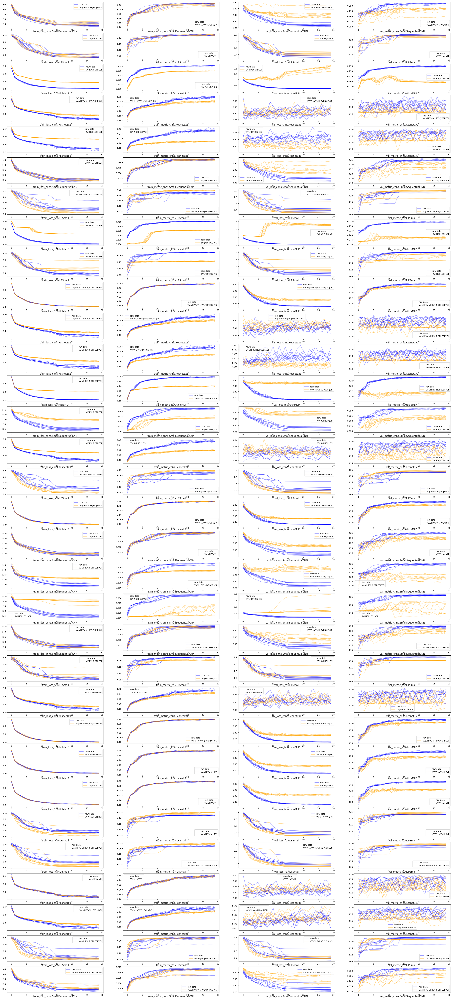

In [6]:
f, ax = plt.subplots(len(unique_setups_s1_with_results), 4, figsize=(40, 90))

for i, (setup, pathes) in enumerate(unique_setups_s1_with_results.items()):
    
    for k, p in enumerate(pathes):
        
        res = get_results(p)
        name = res.pop('experiment_name')
        indexes = re.search(r"Indixes: (.*?),", name).group(1)
        model = re.search(r"Model: (.*?),", name).group(1)
        
        def plot_one_ax(j, value_first, value_sec, indexes=None):

            if not indexes:
                ax[i][j].plot(res[value_first], color='blue', alpha=0.4)
                ax[i][j].plot(res[value_sec], color='orange', alpha=0.4)
                return
            
            ax[i][j].plot(res[value_first], color='blue', label='raw data', alpha=0.4)
            ax[i][j].plot(res[value_sec], color='orange', label = indexes, alpha=0.4)
            ax[i][j].legend()

            ax[i][j].text(0.5, -0.09, value_first.strip(('rawindices')) + model, ha='center', va='top', transform=ax[i][j].transAxes, fontsize=12)

        values = [('train_loss_raw', 'train_loss_indices'), ('train_metric_raw', 'train_metric_indices'), 
                  ('val_loss_raw', 'val_loss_indices'), ('val_metric_raw', 'val_metric_indices')]
        
        for j, (vf, vs) in enumerate(values):
            if k == len(pathes) - 1:
                plot_one_ax(j, vf, vs, indexes)
            plot_one_ax(j, vf, vs)



f.savefig('s1-results.png')

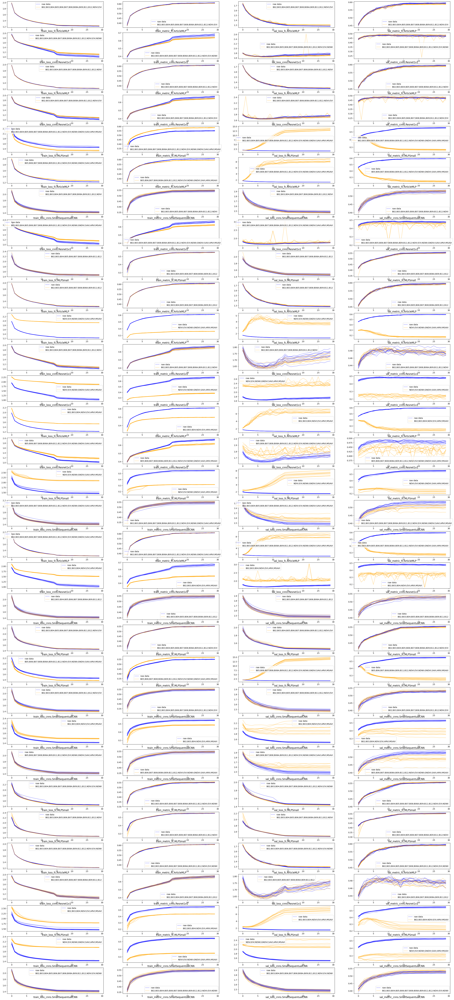

In [7]:
f, ax = plt.subplots(len(unique_setups_s2_with_results), 4, figsize=(40, 90))

for i, (setup, pathes) in enumerate(unique_setups_s2_with_results.items()):
    
    for k, p in enumerate(pathes):
        
        res = get_results(p)
        name = res.pop('experiment_name')
        indexes = re.search(r"Indixes: (.*?),", name).group(1)
        model = re.search(r"Model: (.*?),", name).group(1)
        
        def plot_one_ax(j, value_first, value_sec, indexes=None):

            if not indexes:
                ax[i][j].plot(res[value_first], color='blue', alpha=0.4)
                ax[i][j].plot(res[value_sec], color='orange', alpha=0.4)
                return
            
            ax[i][j].plot(res[value_first], color='blue', label='raw data', alpha=0.4)
            ax[i][j].plot(res[value_sec], color='orange', label = indexes, alpha=0.4)
            ax[i][j].legend()

            ax[i][j].text(0.5, -0.09, value_first.strip(('rawindices')) + model, ha='center', va='top', transform=ax[i][j].transAxes, fontsize=12)

        values = [('train_loss_raw', 'train_loss_indices'), ('train_metric_raw', 'train_metric_indices'), 
                  ('val_loss_raw', 'val_loss_indices'), ('val_metric_raw', 'val_metric_indices')]
        
        for j, (vf, vs) in enumerate(values):
            if k == len(pathes) - 1:
                plot_one_ax(j, vf, vs, indexes)
            plot_one_ax(j, vf, vs)



f.savefig('s2-results.png')
        